In [1]:
import pandas as pd
import io
import requests

from datetime import datetime
from pathlib import Path

In [2]:
import warnings
warnings.filterwarnings("ignore")

## OWID COVID-19 Dataset

### Dataset Fetch

In [3]:
owid_online_dataset = "https://covid.ourworldindata.org/data/owid-covid-data.csv"

In [4]:
"""
Try to fetch the most updated version of the CSV online,
if it fails, fallback to the saved filed
"""
        
online_covid_data = requests.get(owid_online_dataset).content
raw_covid_df = pd.read_csv(io.StringIO(online_covid_data.decode('utf-8')))

### Dataset Cleanup

In [5]:
raw_covid_df.tail(3)

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
429432,ZWE,Africa,Zimbabwe,2024-08-02,266386.0,0.0,0.0,5740.0,0.0,0.0,...,30.7,36.791,1.7,61.49,0.571,16320539,NaN,NaN,NaN,NaN
429433,ZWE,Africa,Zimbabwe,2024-08-03,266386.0,0.0,0.0,5740.0,0.0,0.0,...,30.7,36.791,1.7,61.49,0.571,16320539,NaN,NaN,NaN,NaN
429434,ZWE,Africa,Zimbabwe,2024-08-04,266386.0,0.0,0.0,5740.0,0.0,0.0,...,30.7,36.791,1.7,61.49,0.571,16320539,NaN,NaN,NaN,NaN


In [6]:
"""Inconsistent Data that needs to be purged"""

raw_covid_df[raw_covid_df['continent'].isnull()].head(5)

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
1674,OWID_AFR,NaN,Africa,2020-01-05,0.0,0.0,NaN,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,1426736614,NaN,NaN,NaN,NaN
1675,OWID_AFR,NaN,Africa,2020-01-06,0.0,0.0,NaN,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,1426736614,NaN,NaN,NaN,NaN
1676,OWID_AFR,NaN,Africa,2020-01-07,0.0,0.0,NaN,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,1426736614,NaN,NaN,NaN,NaN
1677,OWID_AFR,NaN,Africa,2020-01-08,0.0,0.0,NaN,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,1426736614,NaN,NaN,NaN,NaN
1678,OWID_AFR,NaN,Africa,2020-01-09,0.0,0.0,NaN,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,1426736614,NaN,NaN,NaN,NaN


In [7]:
""" Purging Bad Data """

staging_covid_df = raw_covid_df[raw_covid_df['continent'].notnull()].reset_index()

In [8]:
""" Includes a column that will be used to aggregate all data from the month/year """

to_year_month = lambda str_date: datetime.strptime(str_date, "%Y-%m-%d").replace(day=1)

staging_covid_df['year_month'] = staging_covid_df.apply(lambda row: to_year_month(row['date']), axis=1)

### Fixing Geographic Region for Countries

#### North and Central America

In [9]:
""" 
All countries in Central America, such as 'Cuba', 'Panama', 'Costa Rica', etc
are set with the continent as 'North America', let's fix that
"""

na_marked_countries = staging_covid_df.loc[ 
  (staging_covid_df['continent'] == 'North America')
]

na_marked_countries['location'].unique()

array(['Anguilla', 'Antigua and Barbuda', 'Aruba', 'Bahamas', 'Barbados',
       'Belize', 'Bermuda', 'Bonaire Sint Eustatius and Saba',
       'British Virgin Islands', 'Canada', 'Cayman Islands', 'Costa Rica',
       'Cuba', 'Curacao', 'Dominica', 'Dominican Republic', 'El Salvador',
       'Greenland', 'Grenada', 'Guadeloupe', 'Guatemala', 'Haiti',
       'Honduras', 'Jamaica', 'Martinique', 'Mexico', 'Montserrat',
       'Nicaragua', 'Panama', 'Puerto Rico', 'Saint Barthelemy',
       'Saint Kitts and Nevis', 'Saint Lucia',
       'Saint Martin (French part)', 'Saint Pierre and Miquelon',
       'Saint Vincent and the Grenadines', 'Sint Maarten (Dutch part)',
       'Trinidad and Tobago', 'Turks and Caicos Islands', 'United States',
       'United States Virgin Islands'], dtype=object)

In [10]:
"""
All countries in 'continent' == 'North America that are NOT (~): 
'United States', 'Canada' or 'Mexico' should be set as 'Central America
"""

staging_covid_df.loc[ 
    (staging_covid_df['continent'] == 'North America') & 
    (~staging_covid_df['location'].isin(['United States', 'Canada', 'Mexico'])),
    'continent'
] = "Central America"

In [11]:
"""
All countries in Central America, such as 'Cuba', 'Panama', 'Costa Rica', etc
are set with the continent as 'North America', let's fix that
"""

na_countries = staging_covid_df.loc[ 
  (staging_covid_df['continent'] == 'North America')
]

na_countries['location'].unique()

array(['Canada', 'Mexico', 'United States'], dtype=object)

#### Eastern, Western, Northern, Southern Europe

In [12]:
#TODO

### Fixing Labels

In [13]:
""" Renames 'location' to 'country' """

staging_covid_df = staging_covid_df.rename(columns={
    'location': 'country'
})

## Data Aggregation

### Data Aggregation by Country by Period

In [14]:
"""
Sum of number of new_cases and Sum of number of new_deaths 
by aggregating values that havethe same country,and same period (year_month)
"""

covid_by_country_by_period = (
    staging_covid_df
    .groupby(['country', 'iso_code', 'continent', 'year_month'])
    .agg({'new_cases': sum, 'new_deaths': sum})
    .sort_values(by=['year_month', 'country', 'continent'], ascending=[False, True, True])
    .reset_index()
)

In [15]:
covid_by_country_by_period[
  (covid_by_country_by_period['continent'] == 'North America') &
  (covid_by_country_by_period['year_month'] == '2020-03-01')
]

,country,iso_code,continent,year_month,new_cases,new_deaths
12758,Canada,CAN,North America,2020-03-01,4666.0,35.0
12857,Mexico,MEX,North America,2020-03-01,2116.0,28.0
12949,United States,USA,North America,2020-03-01,126269.0,2106.0


### Data Aggregation by Continent by Period

In [16]:
"""
Sum of number of new_cases and Sum of number of new_deaths 
by aggregating values that have the same continent (location), and same period (year_month)

It's gonna be used to compute statistics for each continent
(standard_deviation, mean, median, etc)
"""
covid_by_continent_by_period = (
    covid_by_country_by_period
    .groupby(['year_month', 'continent'])
    .agg({'new_cases': sum, 'new_deaths': sum})
)

In [17]:
covid_by_continent_by_period.loc[('2020-03-01', 'North America')]

new_cases     133051.0
new_deaths      2169.0
Name: (2020-03-01 00:00:00, North America), dtype: float64

### Data Aggregation by Period

In [18]:
"""
Sum of number of new_cases and Sum of number of new_deaths 
by aggregating values that have the same period (year_month)

It's gonna be used to compute global/world statistics 
(standard_deviation, mean, median, etc)
"""

covid_by_period_in_world = (
    covid_by_country_by_period
    .groupby(['year_month'], as_index=['year_month'])
    .agg({'new_cases': sum, 'new_deaths': sum})
)

In [19]:
covid_by_period_in_world.tail(5)

,new_cases,new_deaths
year_month,,
2024-04-01,147440.0,3083.0
2024-05-01,136159.0,2158.0
2024-06-01,190568.0,2914.0
2024-07-01,201714.0,3180.0
2024-08-01,47169.0,815.0


## Generating Statistics

### Base Statistics

In [20]:
"""
Generating statistics per Period (Year-Month) per Continent:
- count => number of countries reporting
- mean => aritmetic average 
- std => standard deviation

Note: Always consider the YEAR-MONTH for the 'year_month' field. 
      The DAY will always be '01'
"""
stats_by_period_by_continent = (
    covid_by_country_by_period
    .groupby(['year_month', 'continent'])
    .describe()
)

stats_by_period_by_continent.tail(12)

new_cases                                        \
                               count         mean          std  min    25%   
year_month continent                                                         
2024-07-01 Central America      38.0    45.236842   130.775945  0.0    0.0   
           Europe               51.0  2903.568627  7276.087870  0.0    0.0   
           North America         3.0  1563.666667  1421.564748  0.0  956.5   
           Oceania              24.0   676.875000  2391.997370  0.0    0.0   
           South America        14.0   341.642857   923.409536  0.0    0.0   
2024-08-01 Africa               57.0     0.631579     3.341469  0.0    0.0   
           Asia                 48.0    94.062500   345.518815  0.0    0.0   
           Central America      38.0     2.000000     9.380832  0.0    0.0   
           Europe               51.0   765.627451  1733.087037  0.0    0.0   
           North America         3.0   126.000000   186.300832  0.0   19.0   
           Oceania              24.0    75.375000   352.612463  0.0    0.0   
           South America        14.0    93.428571   258.424432  0.0    0.0   

                                                     new_deaths              \
                               50%      75%      max      count        mean   
year_month continent                                                          
2024-07-01 Central America     0.0    15.00    697.0       38.0    0.947368   
           Europe            124.0  1692.00  39771.0       51.0   15.274510   
           North America    1913.0  2345.50   2778.0        3.0  722.666667   
           Oceania             0.0     8.75  10697.0       24.0    5.125000   
           South America       1.0   238.00   3501.0       14.0    0.714286   
2024-08-01 Africa              0.0     0.00     18.0       57.0    0.000000   
           Asia                0.0     0.00   2087.0       48.0    0.354167   
           Central America     0.0     0.00     57.0       38.0    0.000000   
           Europe             15.0   600.50   7777.0       51.0    3.176471   
           North America      38.0   189.00    340.0        3.0  206.333333   
           Oceania             0.0     0.00   1730.0       24.0    0.666667   
           South America       1.0    44.25    976.0       14.0    0.071429   

                                                                           
                                    std   min   25%   50%     75%     max  
year_month continent                                                       
2024-07-01 Central America     4.775769   0.0   0.0   0.0     0.0    29.0  
           Europe             47.813420   0.0   0.0   0.0     2.5   275.0  
           North America    1197.173477  22.0  31.5  41.0  1073.0  2105.0  
           Oceania            25.107270   0.0   0.0   0.0     0.0   123.0  
           South America       1.977900   0.0   0.0   0.0     0.0     7.0  
2024-08-01 Africa              0.000000   0.0   0.0   0.0     0.0     0.0  
           Asia                2.168337   0.0   0.0   0.0     0.0    15.0  
           Central America     0.000000   0.0   0.0   0.0     0.0     0.0  
           Europe              9.655477   0.0   0.0   0.0     0.5    50.0  
           North America     357.379817   0.0   0.0   0.0   309.5   619.0  
           Oceania             3.265986   0.0   0.0   0.0     0.0    16.0  
           South America       0.267261   0.0   0.0   0.0     0.0     1.0

In [21]:
"""
Generating GLOBAL statistics per Period (Year-Month):
- count => number of countries reporting  (numero de paises reportanto)
- mean => aritmetic average (média aritmetica)
- std => standard deviation (desvio padrao)

Note: Always consider the YEAR-MONTH for the 'year_month' field. 
      The DAY will always be '01'
"""

stats_by_period_in_world = (
    covid_by_country_by_period
    .groupby(['year_month'])
    .describe()
)

stats_by_period_in_world.tail(6)

new_cases                                                           \
               count         mean          std  min  25%  50%   75%       max   
year_month                                                                      
2024-03-01     235.0  1513.382979  9962.174996  0.0  0.0  1.0  82.5  120492.0   
2024-04-01     235.0   627.404255  4768.626176  0.0  0.0  0.0  35.5   69311.0   
2024-05-01     235.0   579.400000  3493.356354  0.0  0.0  0.0  40.5   45662.0   
2024-06-01     235.0   810.927660  4021.361520  0.0  0.0  0.0  49.5   44926.0   
2024-07-01     235.0   858.357447  3727.911699  0.0  0.0  0.0  34.5   39771.0   
2024-08-01     235.0   200.719149   878.884611  0.0  0.0  0.0   0.0    7777.0   

           new_deaths                                                     
                count       mean         std  min  25%  50%  75%     max  
year_month                                                                
2024-03-01      235.0  28.706383  326.193684  0.0  0.0  0.0  0.0  4983.0  
2024-04-01      235.0  13.119149  139.209684  0.0  0.0  0.0  0.0  2112.0  
2024-05-01      235.0   9.182979   93.941588  0.0  0.0  0.0  0.0  1426.0  
2024-06-01      235.0  12.400000  119.540545  0.0  0.0  0.0  0.0  1794.0  
2024-07-01      235.0  13.531915  139.193810  0.0  0.0  0.0  0.0  2105.0  
2024-08-01      235.0   3.468085   40.614643  0.0  0.0  0.0  0.0   619.0

### New Cases - Statistics per Period per Continent

In [22]:
stats_cases_by_period_by_continent = (
    stats_by_period_by_continent
    .new_cases
    .join(covid_by_continent_by_period)
    .drop(['count', 'new_deaths'], axis=1)
)

stats_cases_by_period_by_continent

mean          std  min   25%   50%     75%  \
year_month continent                                                           
2020-01-01 Africa             0.000000     0.000000  0.0   0.0   0.0    0.00   
           Asia              41.061224   283.494739  0.0   0.0   0.0    0.00   
           Central America    0.000000     0.000000  0.0   0.0   0.0    0.00   
           Europe             0.176471     0.654397  0.0   0.0   0.0    0.00   
           North America      2.666667     3.785939  0.0   0.5   1.0    4.00   
...                                ...          ...  ...   ...   ...     ...   
2024-08-01 Central America    2.000000     9.380832  0.0   0.0   0.0    0.00   
           Europe           765.627451  1733.087037  0.0   0.0  15.0  600.50   
           North America    126.000000   186.300832  0.0  19.0  38.0  189.00   
           Oceania           75.375000   352.612463  0.0   0.0   0.0    0.00   
           South America     93.428571   258.424432  0.0   0.0   1.0   44.25   

                               max  new_cases  
year_month continent                           
2020-01-01 Africa              0.0        0.0  
           Asia             1985.0     2012.0  
           Central America     0.0        0.0  
           Europe              3.0        9.0  
           North America       7.0        8.0  
...                            ...        ...  
2024-08-01 Central America    57.0       76.0  
           Europe           7777.0    39047.0  
           North America     340.0      378.0  
           Oceania          1730.0     1809.0  
           South America     976.0     1308.0  

[392 rows x 8 columns]

### New Cases - Statistics per Period in the WORLD

In [23]:
stats_cases_by_period_in_world = (
    stats_by_period_in_world
    .new_cases
    .join(covid_by_period_in_world)
    .drop(['count', 'new_deaths'], axis=1)
)

stats_cases_by_period_in_world

,mean,std,min,25%,50%,75%,max,new_cases
year_month,,,,,,,,
2020-01-01,8.614407,1.292024e+02,0.0,0.00,0.0,0.00,1985.0,2033.0
2020-02-01,322.940678,4.885621e+03,0.0,0.00,0.0,0.00,75057.0,76214.0
2020-03-01,2559.443515,1.322684e+04,0.0,3.00,46.0,439.00,126269.0,611707.0
2020-04-01,8491.341667,5.391349e+04,0.0,13.00,193.0,1466.50,796638.0,2037922.0
2020-05-01,13181.045833,6.707459e+04,0.0,3.00,278.0,3240.25,862475.0,3163451.0
2020-06-01,16403.508333,7.781389e+04,0.0,4.75,378.5,3807.75,809808.0,3936842.0
2020-07-01,25311.345833,1.412411e+05,0.0,10.75,377.5,6369.25,1668539.0,6074723.0
2020-08-01,38591.358333,2.064158e+05,0.0,36.75,1020.0,9402.75,2157211.0,9261926.0
2020-09-01,33929.520833,1.862955e+05,0.0,27.75,1069.0,8700.25,2449799.0,8143085.0


### New Victims - Statistics per Period per Continent

In [24]:
stats_victims_by_period_by_continent = (
    stats_by_period_by_continent
    .new_deaths
    .join(covid_by_continent_by_period)
    .drop(['count', 'new_cases'], axis=1)
)

stats_victims_by_period_by_continent

mean         std  min  25%  50%    75%  \
year_month continent                                                       
2020-01-01 Africa             0.000000    0.000000  0.0  0.0  0.0    0.0   
           Asia               1.142857    8.000000  0.0  0.0  0.0    0.0   
           Central America    0.000000    0.000000  0.0  0.0  0.0    0.0   
           Europe             0.117647    0.840168  0.0  0.0  0.0    0.0   
           North America      0.000000    0.000000  0.0  0.0  0.0    0.0   
...                                ...         ...  ...  ...  ...    ...   
2024-08-01 Central America    0.000000    0.000000  0.0  0.0  0.0    0.0   
           Europe             3.176471    9.655477  0.0  0.0  0.0    0.5   
           North America    206.333333  357.379817  0.0  0.0  0.0  309.5   
           Oceania            0.666667    3.265986  0.0  0.0  0.0    0.0   
           South America      0.071429    0.267261  0.0  0.0  0.0    0.0   

                              max  new_deaths  
year_month continent                           
2020-01-01 Africa             0.0         0.0  
           Asia              56.0        56.0  
           Central America    0.0         0.0  
           Europe             6.0         6.0  
           North America      0.0         0.0  
...                           ...         ...  
2024-08-01 Central America    0.0         0.0  
           Europe            50.0       162.0  
           North America    619.0       619.0  
           Oceania           16.0        16.0  
           South America      1.0         1.0  

[392 rows x 8 columns]

### New Victims - Statistics per Period in the WORLD

In [25]:
stats_victims_by_period_in_world = (
    stats_by_period_in_world
    .new_deaths
    .join(covid_by_period_in_world)
    .drop(['count', 'new_cases'], axis=1)
)

stats_victims_by_period_in_world

,mean,std,min,25%,50%,75%,max,new_deaths
year_month,,,,,,,,
2020-01-01,0.262712,3.664500,0.0,0.00,0.0,0.00,56.0,62.0
2020-02-01,10.207627,155.571299,0.0,0.00,0.0,0.00,2390.0,2409.0
2020-03-01,149.786611,916.507492,0.0,0.00,0.0,6.00,10021.0,35799.0
2020-04-01,745.358333,4249.370004,0.0,0.00,6.0,59.25,51328.0,178886.0
2020-05-01,768.058333,4191.125455,0.0,0.00,5.0,71.75,51891.0,184334.0
2020-06-01,601.400000,2921.494870,0.0,0.00,3.0,74.50,28083.0,144336.0
2020-07-01,677.108333,3212.677754,0.0,0.00,5.0,85.00,29277.0,162506.0
2020-08-01,914.079167,4371.031591,0.0,0.00,9.0,146.50,36369.0,219379.0
2020-09-01,666.675000,3030.169199,0.0,0.00,8.5,131.25,31005.0,160002.0


### Merging Country, Continent and World Statistics

#### Merging Country New Cases with Continent and World Statistics

In [26]:
"""
Matches each (period, country) with their respective (period, continent),
and adds the continent statistics (standard deviation, mean, percentile, etc) 

And then also matches with the respective (period) from the global/world
statistics as well
"""

cases_df = (
    covid_by_country_by_period
    .set_index(['year_month', 'continent'])
    .merge(stats_cases_by_period_by_continent, left_index=True, right_index=True)
    .rename(columns={
        'new_cases_x': 'new_cases',
        'mean': 'cont_mean',
        'std':  'cont_std_deviation',
        'min':  'cont_min',
        'max':  'cont_max',
        '25%':  'cont_p25%',
        '50%':  'cont_p50%',
        '75%':  'cont_p75%'
    })
    .merge(stats_cases_by_period_in_world, left_index=True, right_index=True)
    .rename(columns={
        'new_cases_x': 'new_cases',
        'mean': 'world_mean',
        'std': 'world_std_deviation',
        'min': 'world_min',
        'max': 'world_max',
        '25%': 'world_p25%',
        '50%': 'world_p50%',
        '75%': 'world_p75%'
    })
    .drop(['new_deaths', 'new_cases_y'], axis=1)\
    .reset_index()
    .set_index(['year_month','country'])
)

In [27]:
"""
This cell is merely for data visualization, 

you can add new `countries` or new `periods` (in the format of YYYY-MM) 
in the lists below to add to the dataframe visualization
"""

countries = ['United States']
periods = ['2020-01', '2020-02', '2020-03']

_ = cases_df.reset_index()
_[
  (_['country' ].isin(countries)) & 
  (_['year_month'].isin(periods)) 
]

,year_month,country,continent,iso_code,new_cases,cont_mean,cont_std_deviation,cont_min,cont_p25%,cont_p50%,cont_p75%,cont_max,world_mean,world_std_deviation,world_min,world_p25%,world_p50%,world_p75%,world_max
12949,2020-03-01,United States,North America,USA,126269.0,44350.333333,70955.102610,2116.0,3391.0,4666.0,65467.5,126269.0,2559.443515,13226.840243,0.0,3.0,46.0,439.0,126269.0
13185,2020-02-01,United States,North America,USA,33.0,14.000000,16.822604,1.0,4.5,8.0,20.5,33.0,322.940678,4885.620928,0.0,0.0,0.0,0.0,75057.0
13421,2020-01-01,United States,North America,USA,7.0,2.666667,3.785939,0.0,0.5,1.0,4.0,7.0,8.614407,129.202396,0.0,0.0,0.0,0.0,1985.0


#### Merging Country New Victims with Continent and World Statistics

In [28]:
victims_df = (
    covid_by_country_by_period.set_index(['year_month', 'continent'])
    .merge(stats_victims_by_period_by_continent, left_index=True, right_index=True)
    .rename(columns={
        'new_deaths_x': 'new_victims',
        'mean': 'cont_mean',
        'std':  'cont_std_deviation',
        'min':  'cont_min',
        'max':  'cont_max',
        '25%':  'cont_p25%',
        '50%':  'cont_p50%',
        '75%':  'cont_p75%'
    })
    .merge(stats_victims_by_period_in_world, left_index=True, right_index=True)
    .rename(columns={
        'mean': 'world_mean',
        'std': 'world_std_deviation',
        'min': 'world_min',
        'max': 'world_max',
        '25%': 'world_p25%',
        '50%': 'world_p50%',
        '75%': 'world_p75%'
    })
    .drop(['new_cases', 'new_deaths', 'new_deaths_y'], axis=1)\
    .reset_index()
    .set_index(['year_month', 'country'])
)

In [29]:
"""
This cell is merely for data visualization, 

you can add new `countries` or new `periods` (in the format of YYYY-MM) 
in the lists below to add to the dataframe visualization
"""

countries = ['United States', 'Canada', 'Germany', 'France']
periods = ['2020-03', '2020-04']

_ = victims_df.reset_index()
_[
  (_['country' ].isin(countries)) & 
  (_['year_month'].isin(periods)) 
]

,year_month,country,continent,iso_code,new_victims,cont_mean,cont_std_deviation,cont_min,cont_p25%,cont_p50%,cont_p75%,cont_max,world_mean,world_std_deviation,world_min,world_p25%,world_p50%,world_p75%,world_max
12518,2020-04-01,Canada,North America,CAN,2264.0,18774.000000,28193.553802,2264.0,2497.0,2730.0,27029.00,51328.0,745.358333,4249.370004,0.0,0.0,6.0,59.25,51328.0
12555,2020-04-01,France,Europe,FRA,11446.0,1853.636364,5394.256484,0.0,14.0,51.0,476.50,31371.0,745.358333,4249.370004,0.0,0.0,6.0,59.25,51328.0
12561,2020-04-01,Germany,Europe,DEU,6104.0,1853.636364,5394.256484,0.0,14.0,51.0,476.50,31371.0,745.358333,4249.370004,0.0,0.0,6.0,59.25,51328.0
12709,2020-04-01,United States,North America,USA,51328.0,18774.000000,28193.553802,2264.0,2497.0,2730.0,27029.00,51328.0,745.358333,4249.370004,0.0,0.0,6.0,59.25,51328.0
12758,2020-03-01,Canada,North America,CAN,35.0,723.000000,1197.718247,28.0,31.5,35.0,1070.50,2106.0,149.786611,916.507492,0.0,0.0,0.0,6.00,10021.0
12795,2020-03-01,France,Europe,FRA,2712.0,538.629630,1832.837982,0.0,0.0,8.0,62.25,10021.0,149.786611,916.507492,0.0,0.0,0.0,6.00,10021.0
12801,2020-03-01,Germany,Europe,DEU,2035.0,538.629630,1832.837982,0.0,0.0,8.0,62.25,10021.0,149.786611,916.507492,0.0,0.0,0.0,6.00,10021.0
12949,2020-03-01,United States,North America,USA,2106.0,723.000000,1197.718247,28.0,31.5,35.0,1070.50,2106.0,149.786611,916.507492,0.0,0.0,0.0,6.00,10021.0


## Plotting Data

In [30]:
import plotly
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go

In [31]:
cases_plotting_df = (
    cases_df
    .reset_index()
    .groupby(['country', 'year_month'])
    .agg({'new_cases': sum})
)

cases_countries = sorted(set(cases_plotting_df.index.get_level_values(0)))

In [32]:
victims_plotting_df = (
    victims_df
    .reset_index()
    .groupby(['country', 'year_month'])
    .agg({'new_victims': sum})
)

victims_countries = sorted(set(victims_plotting_df.index.get_level_values(0)))

### New Cases - Lines

In [33]:
"""
Use the controls on the top right of the chars to zoom in and out, 
or to select a specific part of the graph
"""

fig = go.Figure()

for idx in cases_countries:
    country_data = cases_plotting_df.loc[idx]
    fig.add_trace(go.Scatter(
        x=country_data.index, 
        y=country_data.new_cases,
        mode='lines+markers', 
        name=idx
    ))

fig.update_layout(
    title="New Cases across time in the World", 
    xaxis_nticks=16,
    yaxis_nticks=20
)

fig.show()

### New Cases - Scatter

In [34]:
scatter_plot_cases_df = cases_plotting_df.reset_index()

fig = px.scatter(
    scatter_plot_cases_df, 
    x=scatter_plot_cases_df.year_month, 
    y=scatter_plot_cases_df.new_cases, 
    color=scatter_plot_cases_df.country, 
    trendline='ols'
)

fig.update_layout(
    title="New Cases across time in the World",
    xaxis_nticks=16,
    yaxis_nticks=20
)

fig.show()

### New Cases - Histogram (Barmode='Group')

In [35]:
"""
Make sure to use the controls on the top right of the chars to ZOOM IN and OUT
or to select a specific part of the graph

You can also add/remove the continent names from the `continents` variable
to make the visualizations easier
"""

hist_plot_cases_df = cases_df.reset_index()
continents = ['North America', 'South America', 'Europe', 'Asia', 'Africa']

hist_plot_cases_df = hist_plot_cases_df[hist_plot_cases_df['continent'].isin(continents)]

fig = px.histogram(
    hist_plot_cases_df, 
    x=hist_plot_cases_df.year_month, 
    y=hist_plot_cases_df.new_cases, 
    color=hist_plot_cases_df.country
)

fig.update_layout(
    title=f"New Cases across time in: {', '.join(continents)} ",
    xaxis_nticks=16,
    yaxis_nticks=20,
    barmode='group'
)

fig.show()

### New Cases - Heatmap

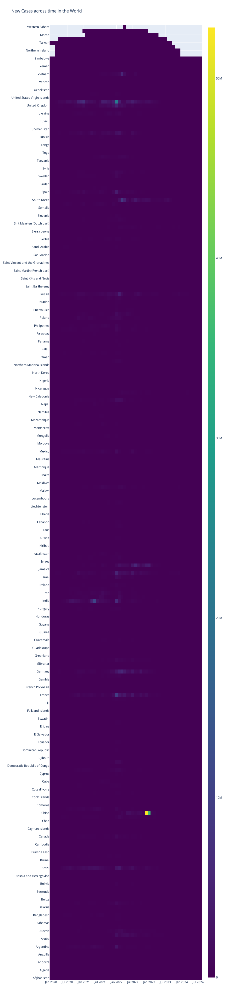

In [36]:
heatmap_plot_cases_df = cases_df.reset_index()

fig = go.Figure(data=go.Heatmap(
    x = heatmap_plot_cases_df.year_month,
    y = heatmap_plot_cases_df.country,
    z = heatmap_plot_cases_df.new_cases,
    colorscale = 'Viridis'
))

fig.update_layout(
    title='New Cases across time in the World',
    xaxis_nticks=16,
    yaxis_nticks=190,
    height=4000
)

fig.show()

### New Victims - Lines

In [37]:
"""
Use the controls on the top right of the chars to zoom in and out, 
or to select a specific part of the graph
"""
fig = go.Figure()

for idx in victims_countries:
    country_data = victims_plotting_df.loc[idx]
    fig.add_trace(go.Scatter(
        x=country_data.index, 
        y=country_data.new_victims,
        mode='lines+markers', 
        name=idx
    ))

fig.update_layout(
    title="Victims across time in the World",
    xaxis_nticks=16,
    yaxis_nticks=20
)

fig.show()

### New Victims - Scatter

In [38]:
scatter_plot_victims_df = victims_plotting_df.reset_index()

fig = px.scatter(
    scatter_plot_victims_df, 
    x=scatter_plot_victims_df.year_month, 
    y=scatter_plot_victims_df.new_victims, 
    color=scatter_plot_victims_df.country, 
    trendline='ols'
)

fig.update_layout(
    title="Victims across time in the World",
    xaxis_nticks=16,
    yaxis_nticks=20
)

fig.show()

### New Victims - Histogram (Barmode='Group')

In [39]:
"""
Make sure to use the controls on the top right of the chars to ZOOM IN and OUT
or to select a specific part of the graph

You can also add/remove the continent names from the `continents` variable
to make the visualizations easier
"""

hist_plot_victims_df = victims_df.reset_index()
continents = ['North America', 'South America', 'Europe', 'Asia', 'Africa']

hist_victim_data = hist_plot_victims_df[hist_plot_victims_df['continent'].isin(continents)]

fig = px.histogram(
    hist_plot_victims_df, 
    x=hist_plot_victims_df.year_month, 
    y=hist_plot_victims_df.new_victims, 
    color=hist_plot_victims_df.country
)

fig.update_layout(
    title=f"Victims accross time in {', '.join(continents)} ",
    xaxis_nticks=16,
    yaxis_nticks=20,
    barmode='group'
)

fig.show()

### New Victims - Heatmap

In [40]:
heatmap_plot_victims_df = victims_df.reset_index()

fig = go.Figure(data=go.Heatmap(
    x = heatmap_plot_victims_df.year_month,
    y = heatmap_plot_victims_df.country,
    z = heatmap_plot_victims_df.new_victims,
    colorscale = 'Viridis'    
))

fig.update_layout(
    title='Victims across time in the World',
    xaxis_nticks=16,
    yaxis_nticks=190,
    height=4000
)

fig.show()